In [1]:
import pandas as pd
import cv2

In [2]:
df = pd.read_csv('vignettes/stat_vignettes_bis.csv', index_col="Unnamed: 0")

In [3]:
df

,dept,file,wood_size,w_mean_R,w_mean_G,w_mean_B,nw_mean_R,nw_mean_G,nw_mean_B,w_std_R,...,w_mean_texture_B,nw_mean_texture_R,nw_mean_texture_G,nw_mean_texture_B,w_std_texture_R,w_std_texture_G,w_std_texture_B,nw_std_texture_R,nw_std_texture_G,nw_std_texture_B
0,14,rgb_14_394000_6868000.jpg,13481085,69.240755,88.753381,75.553805,65.706553,80.866742,74.101573,28.315210,...,3663.827511,3166.548559,3900.198491,3577.777438,1032.448652,1236.180916,683.507885,1348.300801,1490.836680,869.201353
1,14,rgb_14_394000_6868144.jpg,9162660,69.744323,89.306273,75.389792,77.396409,96.737152,80.501532,29.082338,...,3634.189469,3758.851166,4698.322641,3910.985004,1067.252381,1285.468444,702.834535,1185.516837,1415.048201,719.985249
2,14,rgb_14_394000_6868288.jpg,1965540,85.332771,108.023482,85.302673,91.303086,115.005636,88.426086,28.510496,...,3997.426700,4435.465309,5589.218193,4296.371351,1234.735880,1337.333657,829.306020,769.588095,691.581824,481.441528
3,14,rgb_14_394000_6868432.jpg,5361120,86.877331,98.676084,83.642884,144.215682,140.218233,119.715359,38.653178,...,4080.345510,6972.971754,6779.863098,5791.034173,1694.519272,1539.748377,1026.227076,2317.855054,1643.874372,1512.092916
4,14,rgb_14_394000_6868576.jpg,1822485,98.030922,113.819785,88.853925,169.406322,153.295816,129.446231,30.025632,...,4268.593536,8209.928638,7429.269932,6274.241197,1308.568324,1325.961732,735.995407,1481.686640,1176.672957,938.547449
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46579,61,rgb_61_511720_6871144.jpg,0,NaN,NaN,NaN,78.905008,91.688308,84.773498,NaN,...,NaN,3809.266023,4432.018892,4098.764419,NaN,NaN,NaN,1239.437524,840.100913,699.950893
46580,61,rgb_61_511720_6871288.jpg,0,NaN,NaN,NaN,77.847186,94.163990,83.468617,NaN,...,NaN,3770.284433,4560.183546,4041.778646,NaN,NaN,NaN,375.011028,384.219778,314.328272
46581,61,rgb_61_511720_6871432.jpg,1012350,68.667254,82.897481,86.192443,136.388925,132.282853,119.997657,27.323620,...,4226.650882,6601.040241,6402.573834,5808.222238,1242.602420,1048.216392,543.220018,2300.158731,1595.015248,1343.538726
46582,61,rgb_61_511720_6871576.jpg,439875,77.343768,90.373913,89.445797,180.625605,164.707458,148.064899,29.176257,...,4298.515942,8749.858691,7978.889410,7172.235782,1335.343495,1095.199192,713.788442,726.390910,630.274995,536.511275


In [4]:
from sklearn.cluster import KMeans, AgglomerativeClustering
import numpy as np

In [5]:
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt

In [6]:
X = df.drop(["dept", 'file'], axis=1)

In [7]:
X = normalize(X.replace(np.nan, 0))

In [8]:
n_clusters = 9
kmeans = KMeans(n_clusters=n_clusters, random_state=3, n_init="auto")

In [9]:
kmeans.fit(X)
kmeans.labels_

C:\Users\adelabrosse\.conda\envs\inrae_seg_env\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\adelabrosse\.conda\envs\inrae_seg_env\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


array([0, 0, 0, ..., 0, 0, 1])

In [10]:
df

,dept,file,wood_size,w_mean_R,w_mean_G,w_mean_B,nw_mean_R,nw_mean_G,nw_mean_B,w_std_R,...,w_mean_texture_B,nw_mean_texture_R,nw_mean_texture_G,nw_mean_texture_B,w_std_texture_R,w_std_texture_G,w_std_texture_B,nw_std_texture_R,nw_std_texture_G,nw_std_texture_B
0,14,rgb_14_394000_6868000.jpg,13481085,69.240755,88.753381,75.553805,65.706553,80.866742,74.101573,28.315210,...,3663.827511,3166.548559,3900.198491,3577.777438,1032.448652,1236.180916,683.507885,1348.300801,1490.836680,869.201353
1,14,rgb_14_394000_6868144.jpg,9162660,69.744323,89.306273,75.389792,77.396409,96.737152,80.501532,29.082338,...,3634.189469,3758.851166,4698.322641,3910.985004,1067.252381,1285.468444,702.834535,1185.516837,1415.048201,719.985249
2,14,rgb_14_394000_6868288.jpg,1965540,85.332771,108.023482,85.302673,91.303086,115.005636,88.426086,28.510496,...,3997.426700,4435.465309,5589.218193,4296.371351,1234.735880,1337.333657,829.306020,769.588095,691.581824,481.441528
3,14,rgb_14_394000_6868432.jpg,5361120,86.877331,98.676084,83.642884,144.215682,140.218233,119.715359,38.653178,...,4080.345510,6972.971754,6779.863098,5791.034173,1694.519272,1539.748377,1026.227076,2317.855054,1643.874372,1512.092916
4,14,rgb_14_394000_6868576.jpg,1822485,98.030922,113.819785,88.853925,169.406322,153.295816,129.446231,30.025632,...,4268.593536,8209.928638,7429.269932,6274.241197,1308.568324,1325.961732,735.995407,1481.686640,1176.672957,938.547449
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46579,61,rgb_61_511720_6871144.jpg,0,NaN,NaN,NaN,78.905008,91.688308,84.773498,NaN,...,NaN,3809.266023,4432.018892,4098.764419,NaN,NaN,NaN,1239.437524,840.100913,699.950893
46580,61,rgb_61_511720_6871288.jpg,0,NaN,NaN,NaN,77.847186,94.163990,83.468617,NaN,...,NaN,3770.284433,4560.183546,4041.778646,NaN,NaN,NaN,375.011028,384.219778,314.328272
46581,61,rgb_61_511720_6871432.jpg,1012350,68.667254,82.897481,86.192443,136.388925,132.282853,119.997657,27.323620,...,4226.650882,6601.040241,6402.573834,5808.222238,1242.602420,1048.216392,543.220018,2300.158731,1595.015248,1343.538726
46582,61,rgb_61_511720_6871576.jpg,439875,77.343768,90.373913,89.445797,180.625605,164.707458,148.064899,29.176257,...,4298.515942,8749.858691,7978.889410,7172.235782,1335.343495,1095.199192,713.788442,726.390910,630.274995,536.511275


In [11]:
X_copy = X.copy()
pca = PCA(n_components=2)
X_copy = pca.fit_transform(X_copy)
print(pca.explained_variance_ratio_)
print(pca.singular_values_)

[0.95374464 0.03032108]
[89.69495961 15.99279354]


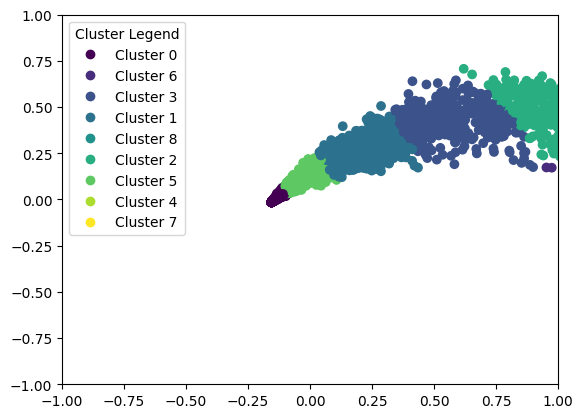

In [12]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import KMeans

# Assuming you already have your DataFrame and kmeans.labels_ defined
# X_copy = your DataFrame

# Create a scatter plot with color-coded points based on cluster labels
plt.xlim([-1, 1])
plt.ylim([-1, 1])

scatter = plt.scatter(X_copy.T[0], X_copy.T[1], c=kmeans.labels_)

# Get unique cluster labels
unique_labels = pd.unique(kmeans.labels_)

# Create a legend by associating each unique label with a color
legend_labels = [f'Cluster {label}' for label in unique_labels]

# Create a legend using the legend_labels and the scatter points
plt.legend(handles=scatter.legend_elements()[0], labels=legend_labels, title="Cluster Legend")

plt.show()


In [13]:
clustered_df = pd.DataFrame(X_copy)
clustered_df['cluster'] = kmeans.labels_

In [14]:
clustered_df['file'] = df['file']
clustered_df['dept'] = df['dept']

In [15]:
clustered_df[(clustered_df['cluster'] == 0) & (clustered_df['dept'] == 35)]# .file.tolist()

,0,1,cluster,file,dept
10440,-0.155053,-0.014565,0,rgb_35_305000_6780000.jpg,35
10441,-0.155427,-0.014913,0,rgb_35_305000_6780144.jpg,35
10442,-0.150834,-0.010588,0,rgb_35_305000_6780288.jpg,35
10443,-0.155698,-0.015199,0,rgb_35_305000_6780432.jpg,35
10444,-0.155823,-0.015281,0,rgb_35_305000_6780576.jpg,35
...,...,...,...,...,...
23752,-0.153677,-0.012969,0,rgb_35_334576_6855576.jpg,35
23753,-0.153440,-0.012704,0,rgb_35_334576_6855720.jpg,35
23757,-0.109562,0.045139,0,rgb_35_334720_6855432.jpg,35
23758,-0.150511,-0.008497,0,rgb_35_334720_6855576.jpg,35


In [35]:
X_copy_bis = df.copy()

In [36]:
X_copy_bis['cluster'] = clustered_df['cluster']

In [62]:
X_cluster_0_only = X_copy_bis[X_copy_bis['cluster'] ==  0]

# Cluster 0

In [16]:
file_paths = clustered_df[(clustered_df['cluster'] == 0)].file.sample(6).values

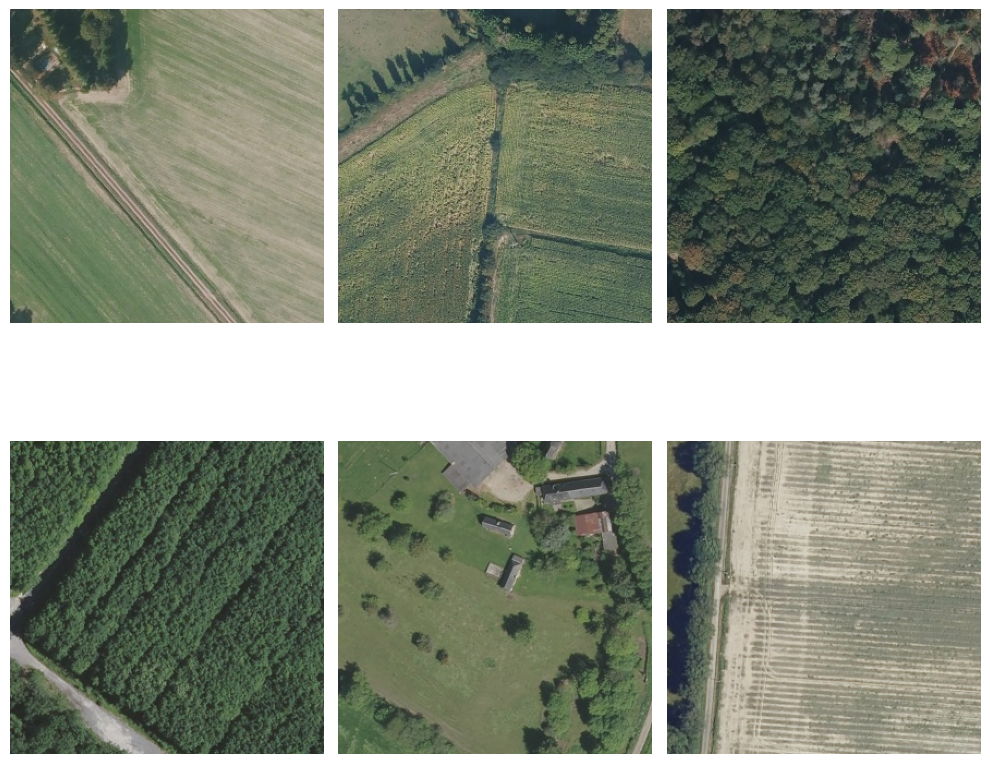

In [17]:
img_1 = cv2.imread(f'vignettes/rgb/{file_paths[0][4:6]}/rgb_{int(10*(np.floor(int(file_paths[0][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[0][14:18])/10 * 2) / 2))}/{file_paths[0]}')
img_2 = cv2.imread(f'vignettes/rgb/{file_paths[1][4:6]}/rgb_{int(10*(np.floor(int(file_paths[1][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[1][14:18])/10 * 2) / 2))}/{file_paths[1]}')
img_3 = cv2.imread(f'vignettes/rgb/{file_paths[2][4:6]}/rgb_{int(10*(np.floor(int(file_paths[2][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[2][14:18])/10 * 2) / 2))}/{file_paths[2]}')
img_4 = cv2.imread(f'vignettes/rgb/{file_paths[3][4:6]}/rgb_{int(10*(np.floor(int(file_paths[3][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[3][14:18])/10 * 2) / 2))}/{file_paths[3]}')
img_5 = cv2.imread(f'vignettes/rgb/{file_paths[4][4:6]}/rgb_{int(10*(np.floor(int(file_paths[4][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[4][14:18])/10 * 2) / 2))}/{file_paths[4]}')
img_6 = cv2.imread(f'vignettes/rgb/{file_paths[5][4:6]}/rgb_{int(10*(np.floor(int(file_paths[5][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[5][14:18])/10 * 2) / 2))}/{file_paths[5]}')

fig, axes = plt.subplots(nrows=2, ncols=3,
                         sharex=True, sharey=True, figsize=(10, 10))

ax = axes.ravel()

ax[0].imshow(img_1)
ax[1].imshow(img_2)
ax[2].imshow(img_3)
ax[3].imshow(img_4)
ax[4].imshow(img_5)
ax[5].imshow(img_6)

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

# Cluster 1

In [18]:
file_paths = clustered_df[(clustered_df['cluster'] == 1)].file.sample(6).values

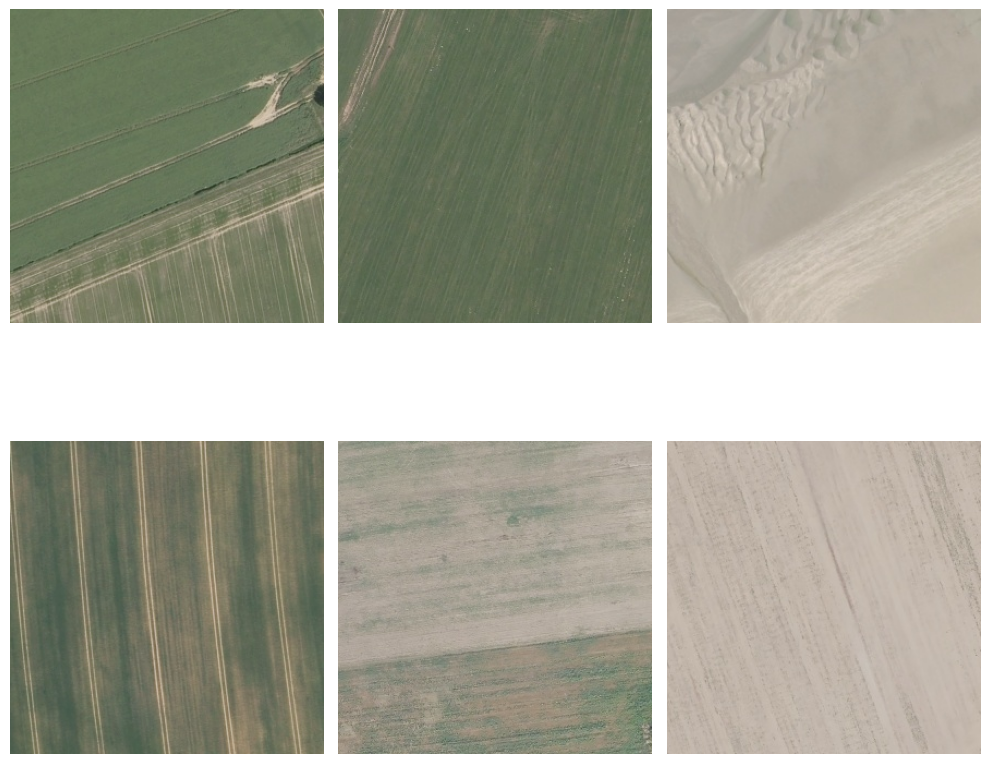

In [19]:
img_1 = cv2.imread(f'vignettes/rgb/{file_paths[0][4:6]}/rgb_{int(10*(np.floor(int(file_paths[0][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[0][14:18])/10 * 2) / 2))}/{file_paths[0]}')
img_2 = cv2.imread(f'vignettes/rgb/{file_paths[1][4:6]}/rgb_{int(10*(np.floor(int(file_paths[1][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[1][14:18])/10 * 2) / 2))}/{file_paths[1]}')
img_3 = cv2.imread(f'vignettes/rgb/{file_paths[2][4:6]}/rgb_{int(10*(np.floor(int(file_paths[2][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[2][14:18])/10 * 2) / 2))}/{file_paths[2]}')
img_4 = cv2.imread(f'vignettes/rgb/{file_paths[3][4:6]}/rgb_{int(10*(np.floor(int(file_paths[3][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[3][14:18])/10 * 2) / 2))}/{file_paths[3]}')
img_5 = cv2.imread(f'vignettes/rgb/{file_paths[4][4:6]}/rgb_{int(10*(np.floor(int(file_paths[4][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[4][14:18])/10 * 2) / 2))}/{file_paths[4]}')
img_6 = cv2.imread(f'vignettes/rgb/{file_paths[5][4:6]}/rgb_{int(10*(np.floor(int(file_paths[5][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[5][14:18])/10 * 2) / 2))}/{file_paths[5]}')

fig, axes = plt.subplots(nrows=2, ncols=3,
                         sharex=True, sharey=True, figsize=(10, 10))

ax = axes.ravel()

ax[0].imshow(img_1)
ax[1].imshow(img_2)
ax[2].imshow(img_3)
ax[3].imshow(img_4)
ax[4].imshow(img_5)
ax[5].imshow(img_6)

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

# Cluster 2

In [20]:
file_paths = clustered_df[(clustered_df['cluster'] == 2)].file.sample(6).values

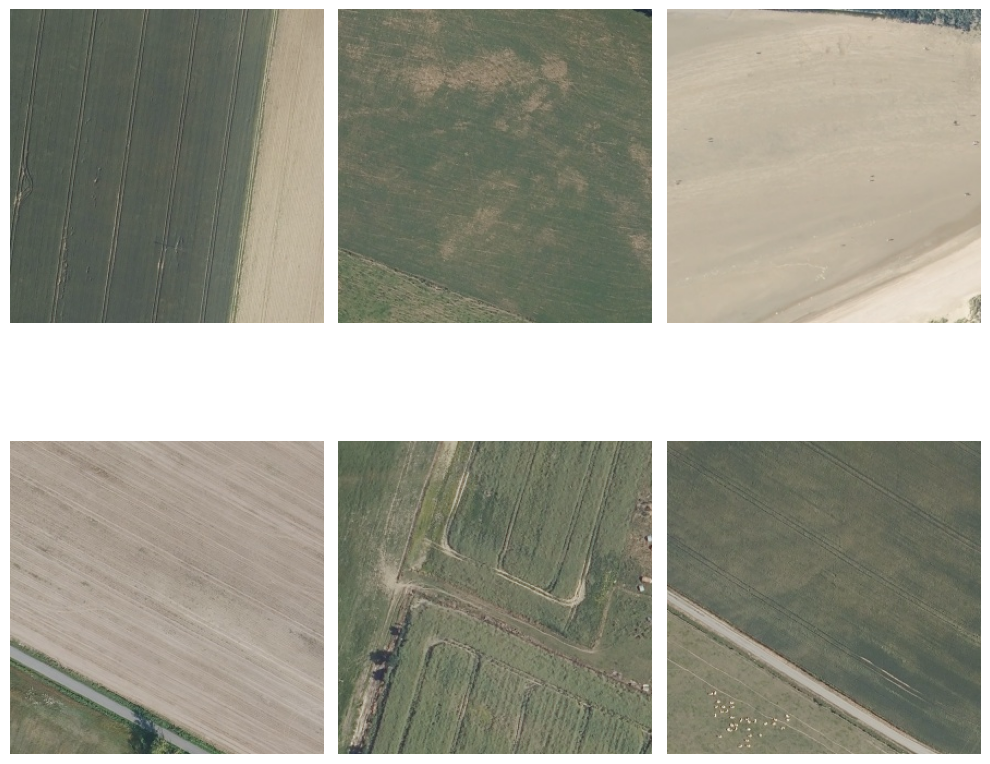

In [21]:
img_1 = cv2.imread(f'vignettes/rgb/{file_paths[0][4:6]}/rgb_{int(10*(np.floor(int(file_paths[0][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[0][14:18])/10 * 2) / 2))}/{file_paths[0]}')
img_2 = cv2.imread(f'vignettes/rgb/{file_paths[1][4:6]}/rgb_{int(10*(np.floor(int(file_paths[1][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[1][14:18])/10 * 2) / 2))}/{file_paths[1]}')
img_3 = cv2.imread(f'vignettes/rgb/{file_paths[2][4:6]}/rgb_{int(10*(np.floor(int(file_paths[2][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[2][14:18])/10 * 2) / 2))}/{file_paths[2]}')
img_4 = cv2.imread(f'vignettes/rgb/{file_paths[3][4:6]}/rgb_{int(10*(np.floor(int(file_paths[3][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[3][14:18])/10 * 2) / 2))}/{file_paths[3]}')
img_5 = cv2.imread(f'vignettes/rgb/{file_paths[4][4:6]}/rgb_{int(10*(np.floor(int(file_paths[4][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[4][14:18])/10 * 2) / 2))}/{file_paths[4]}')
img_6 = cv2.imread(f'vignettes/rgb/{file_paths[5][4:6]}/rgb_{int(10*(np.floor(int(file_paths[5][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[5][14:18])/10 * 2) / 2))}/{file_paths[5]}')

fig, axes = plt.subplots(nrows=2, ncols=3,
                         sharex=True, sharey=True, figsize=(10, 10))

ax = axes.ravel()

ax[0].imshow(img_1)
ax[1].imshow(img_2)
ax[2].imshow(img_3)
ax[3].imshow(img_4)
ax[4].imshow(img_5)
ax[5].imshow(img_6)

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

# Cluster 3

In [22]:
file_paths = clustered_df[(clustered_df['cluster'] == 3)].file.sample(6).values

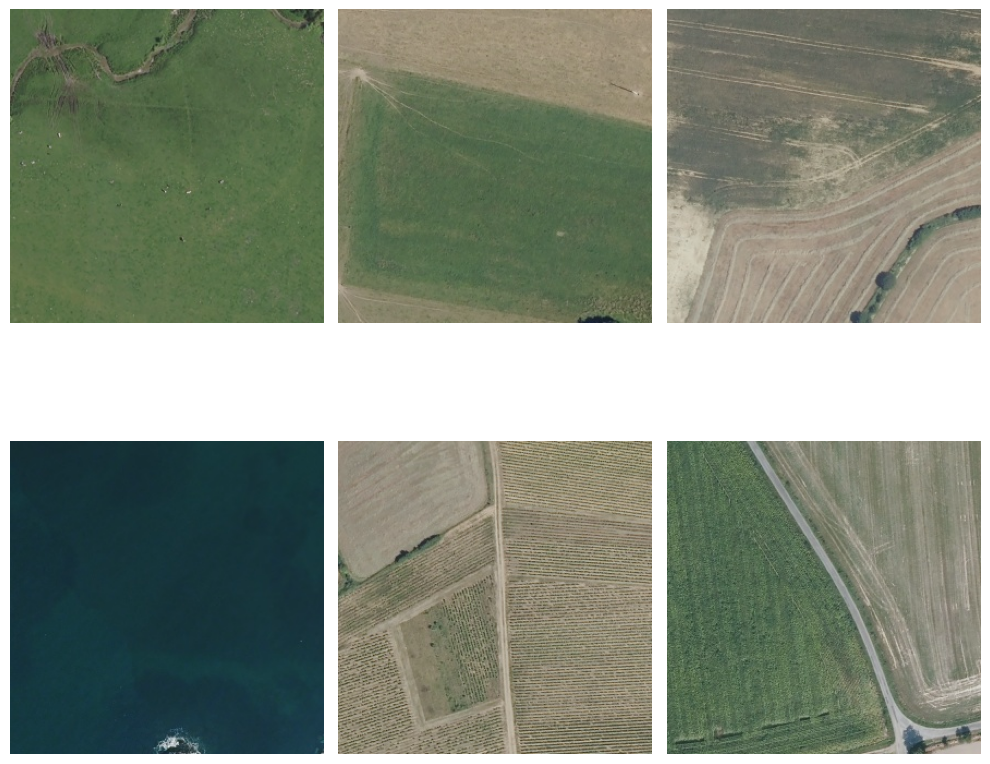

In [23]:
img_1 = cv2.imread(f'vignettes/rgb/{file_paths[0][4:6]}/rgb_{int(10*(np.floor(int(file_paths[0][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[0][14:18])/10 * 2) / 2))}/{file_paths[0]}')
img_2 = cv2.imread(f'vignettes/rgb/{file_paths[1][4:6]}/rgb_{int(10*(np.floor(int(file_paths[1][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[1][14:18])/10 * 2) / 2))}/{file_paths[1]}')
img_3 = cv2.imread(f'vignettes/rgb/{file_paths[2][4:6]}/rgb_{int(10*(np.floor(int(file_paths[2][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[2][14:18])/10 * 2) / 2))}/{file_paths[2]}')
img_4 = cv2.imread(f'vignettes/rgb/{file_paths[3][4:6]}/rgb_{int(10*(np.floor(int(file_paths[3][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[3][14:18])/10 * 2) / 2))}/{file_paths[3]}')
img_5 = cv2.imread(f'vignettes/rgb/{file_paths[4][4:6]}/rgb_{int(10*(np.floor(int(file_paths[4][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[4][14:18])/10 * 2) / 2))}/{file_paths[4]}')
img_6 = cv2.imread(f'vignettes/rgb/{file_paths[5][4:6]}/rgb_{int(10*(np.floor(int(file_paths[5][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[5][14:18])/10 * 2) / 2))}/{file_paths[5]}')

fig, axes = plt.subplots(nrows=2, ncols=3,
                         sharex=True, sharey=True, figsize=(10, 10))

ax = axes.ravel()

ax[0].imshow(img_1)
ax[1].imshow(img_2)
ax[2].imshow(img_3)
ax[3].imshow(img_4)
ax[4].imshow(img_5)
ax[5].imshow(img_6)

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

# Cluster 4

In [24]:
file_paths = clustered_df[(clustered_df['cluster'] == 4)].file.sample(6).values

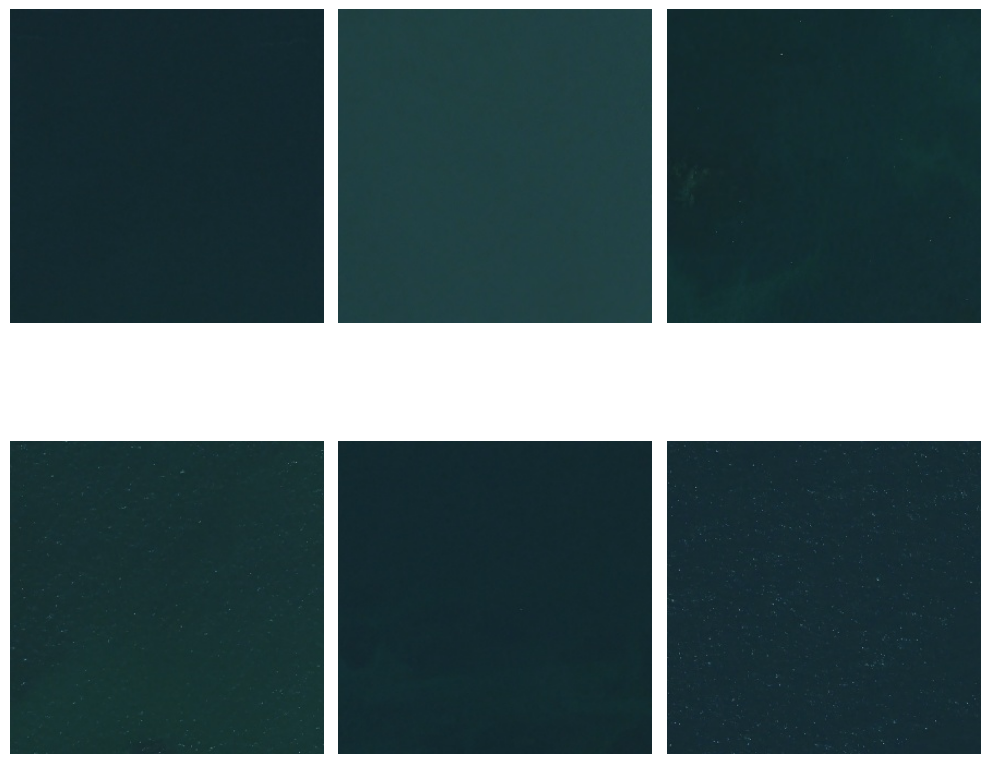

In [25]:
img_1 = cv2.imread(f'vignettes/rgb/{file_paths[0][4:6]}/rgb_{int(10*(np.floor(int(file_paths[0][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[0][14:18])/10 * 2) / 2))}/{file_paths[0]}')
img_2 = cv2.imread(f'vignettes/rgb/{file_paths[1][4:6]}/rgb_{int(10*(np.floor(int(file_paths[1][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[1][14:18])/10 * 2) / 2))}/{file_paths[1]}')
img_3 = cv2.imread(f'vignettes/rgb/{file_paths[2][4:6]}/rgb_{int(10*(np.floor(int(file_paths[2][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[2][14:18])/10 * 2) / 2))}/{file_paths[2]}')
img_4 = cv2.imread(f'vignettes/rgb/{file_paths[3][4:6]}/rgb_{int(10*(np.floor(int(file_paths[3][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[3][14:18])/10 * 2) / 2))}/{file_paths[3]}')
img_5 = cv2.imread(f'vignettes/rgb/{file_paths[4][4:6]}/rgb_{int(10*(np.floor(int(file_paths[4][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[4][14:18])/10 * 2) / 2))}/{file_paths[4]}')
img_6 = cv2.imread(f'vignettes/rgb/{file_paths[5][4:6]}/rgb_{int(10*(np.floor(int(file_paths[5][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[5][14:18])/10 * 2) / 2))}/{file_paths[5]}')

fig, axes = plt.subplots(nrows=2, ncols=3,
                         sharex=True, sharey=True, figsize=(10, 10))

ax = axes.ravel()

ax[0].imshow(img_1)
ax[1].imshow(img_2)
ax[2].imshow(img_3)
ax[3].imshow(img_4)
ax[4].imshow(img_5)
ax[5].imshow(img_6)

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

# Cluster 5

In [26]:
file_paths = clustered_df[(clustered_df['cluster'] == 5)].file.sample(6).values

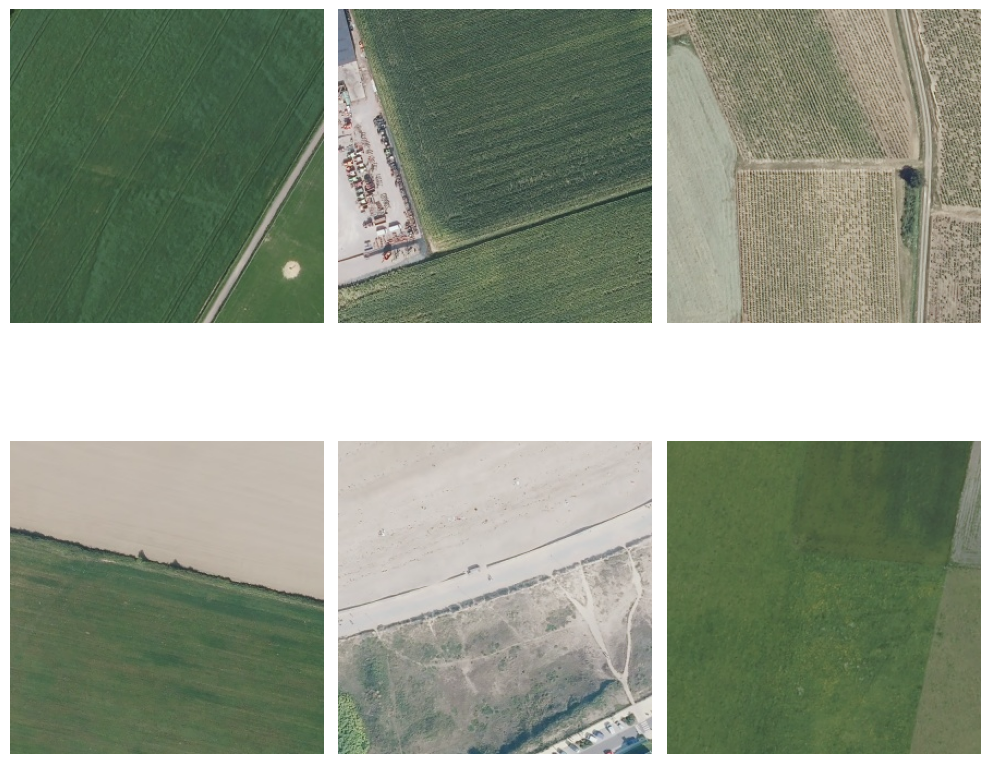

In [27]:
img_1 = cv2.imread(f'vignettes/rgb/{file_paths[0][4:6]}/rgb_{int(10*(np.floor(int(file_paths[0][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[0][14:18])/10 * 2) / 2))}/{file_paths[0]}')
img_2 = cv2.imread(f'vignettes/rgb/{file_paths[1][4:6]}/rgb_{int(10*(np.floor(int(file_paths[1][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[1][14:18])/10 * 2) / 2))}/{file_paths[1]}')
img_3 = cv2.imread(f'vignettes/rgb/{file_paths[2][4:6]}/rgb_{int(10*(np.floor(int(file_paths[2][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[2][14:18])/10 * 2) / 2))}/{file_paths[2]}')
img_4 = cv2.imread(f'vignettes/rgb/{file_paths[3][4:6]}/rgb_{int(10*(np.floor(int(file_paths[3][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[3][14:18])/10 * 2) / 2))}/{file_paths[3]}')
img_5 = cv2.imread(f'vignettes/rgb/{file_paths[4][4:6]}/rgb_{int(10*(np.floor(int(file_paths[4][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[4][14:18])/10 * 2) / 2))}/{file_paths[4]}')
img_6 = cv2.imread(f'vignettes/rgb/{file_paths[5][4:6]}/rgb_{int(10*(np.floor(int(file_paths[5][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[5][14:18])/10 * 2) / 2))}/{file_paths[5]}')

fig, axes = plt.subplots(nrows=2, ncols=3,
                         sharex=True, sharey=True, figsize=(10, 10))

ax = axes.ravel()

ax[0].imshow(img_1)
ax[1].imshow(img_2)
ax[2].imshow(img_3)
ax[3].imshow(img_4)
ax[4].imshow(img_5)
ax[5].imshow(img_6)

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

# Cluster 6

In [28]:
file_paths = clustered_df[(clustered_df['cluster'] == 6)].file.sample(6).values

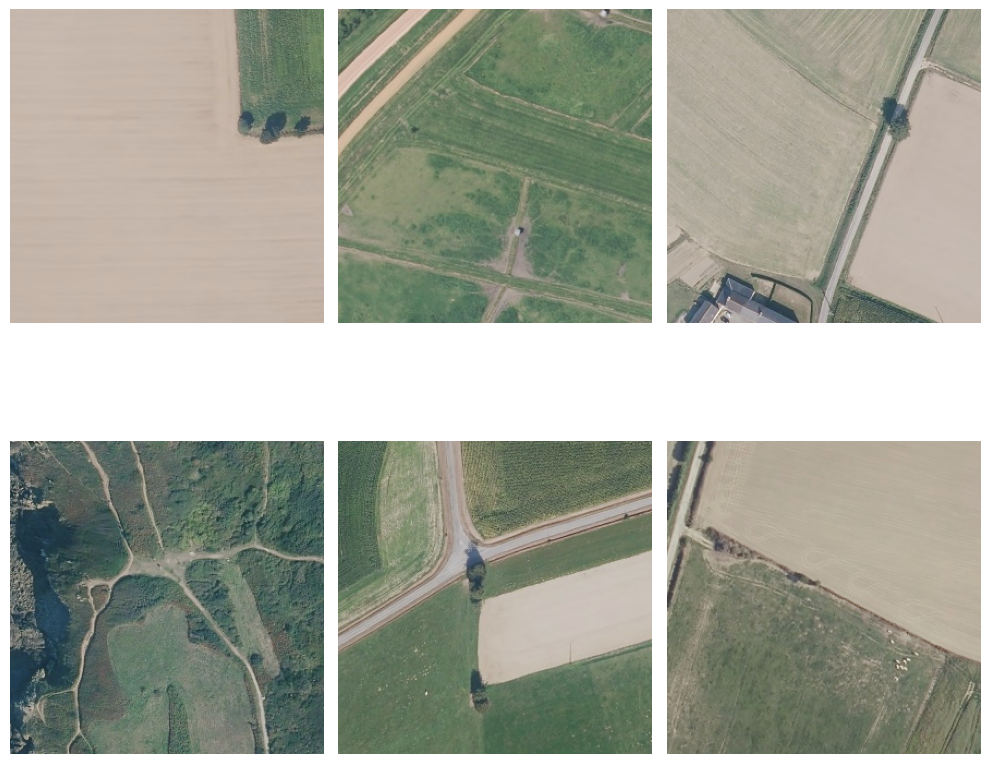

In [29]:
img_1 = cv2.imread(f'vignettes/rgb/{file_paths[0][4:6]}/rgb_{int(10*(np.floor(int(file_paths[0][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[0][14:18])/10 * 2) / 2))}/{file_paths[0]}')
img_2 = cv2.imread(f'vignettes/rgb/{file_paths[1][4:6]}/rgb_{int(10*(np.floor(int(file_paths[1][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[1][14:18])/10 * 2) / 2))}/{file_paths[1]}')
img_3 = cv2.imread(f'vignettes/rgb/{file_paths[2][4:6]}/rgb_{int(10*(np.floor(int(file_paths[2][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[2][14:18])/10 * 2) / 2))}/{file_paths[2]}')
img_4 = cv2.imread(f'vignettes/rgb/{file_paths[3][4:6]}/rgb_{int(10*(np.floor(int(file_paths[3][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[3][14:18])/10 * 2) / 2))}/{file_paths[3]}')
img_5 = cv2.imread(f'vignettes/rgb/{file_paths[4][4:6]}/rgb_{int(10*(np.floor(int(file_paths[4][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[4][14:18])/10 * 2) / 2))}/{file_paths[4]}')
img_6 = cv2.imread(f'vignettes/rgb/{file_paths[5][4:6]}/rgb_{int(10*(np.floor(int(file_paths[5][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[5][14:18])/10 * 2) / 2))}/{file_paths[5]}')

fig, axes = plt.subplots(nrows=2, ncols=3,
                         sharex=True, sharey=True, figsize=(10, 10))

ax = axes.ravel()

ax[0].imshow(img_1)
ax[1].imshow(img_2)
ax[2].imshow(img_3)
ax[3].imshow(img_4)
ax[4].imshow(img_5)
ax[5].imshow(img_6)

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

# Cluster 7

In [30]:
file_paths = clustered_df[(clustered_df['cluster'] == 7)].file.sample(6).values

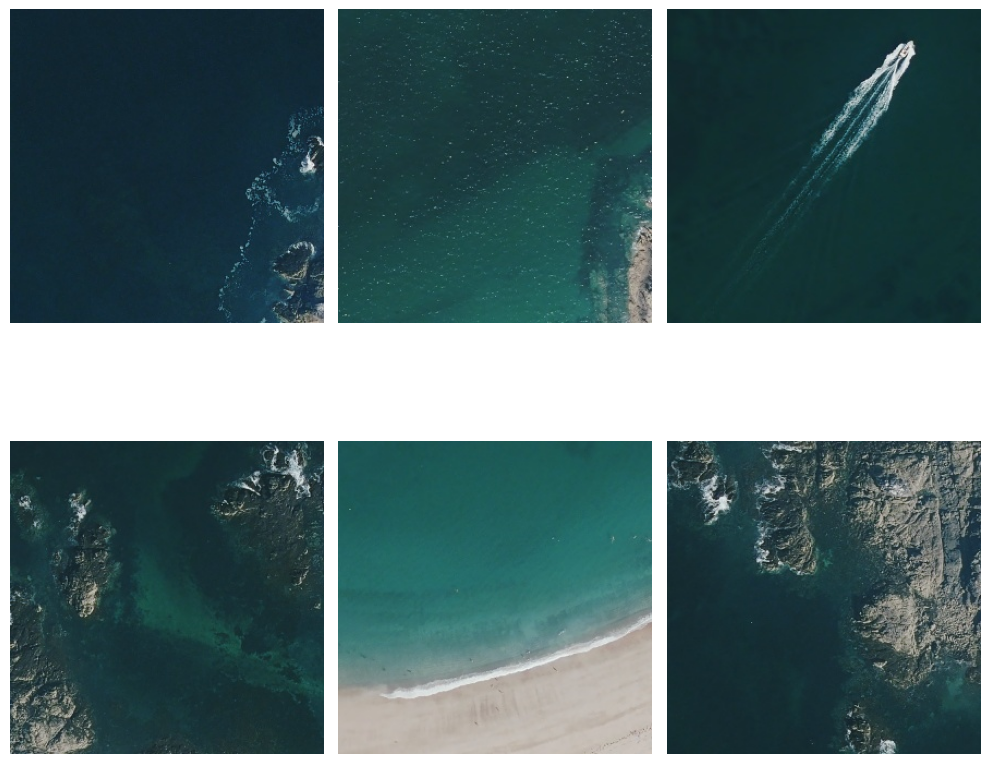

In [31]:
img_1 = cv2.imread(f'vignettes/rgb/{file_paths[0][4:6]}/rgb_{int(10*(np.floor(int(file_paths[0][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[0][14:18])/10 * 2) / 2))}/{file_paths[0]}')
img_2 = cv2.imread(f'vignettes/rgb/{file_paths[1][4:6]}/rgb_{int(10*(np.floor(int(file_paths[1][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[1][14:18])/10 * 2) / 2))}/{file_paths[1]}')
img_3 = cv2.imread(f'vignettes/rgb/{file_paths[2][4:6]}/rgb_{int(10*(np.floor(int(file_paths[2][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[2][14:18])/10 * 2) / 2))}/{file_paths[2]}')
img_4 = cv2.imread(f'vignettes/rgb/{file_paths[3][4:6]}/rgb_{int(10*(np.floor(int(file_paths[3][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[3][14:18])/10 * 2) / 2))}/{file_paths[3]}')
img_5 = cv2.imread(f'vignettes/rgb/{file_paths[4][4:6]}/rgb_{int(10*(np.floor(int(file_paths[4][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[4][14:18])/10 * 2) / 2))}/{file_paths[4]}')
img_6 = cv2.imread(f'vignettes/rgb/{file_paths[5][4:6]}/rgb_{int(10*(np.floor(int(file_paths[5][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[5][14:18])/10 * 2) / 2))}/{file_paths[5]}')

fig, axes = plt.subplots(nrows=2, ncols=3,
                         sharex=True, sharey=True, figsize=(10, 10))

ax = axes.ravel()

ax[0].imshow(img_1)
ax[1].imshow(img_2)
ax[2].imshow(img_3)
ax[3].imshow(img_4)
ax[4].imshow(img_5)
ax[5].imshow(img_6)

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

# Cluster 8

In [32]:
file_paths = clustered_df[(clustered_df['cluster'] == 8)].file.sample(6).values

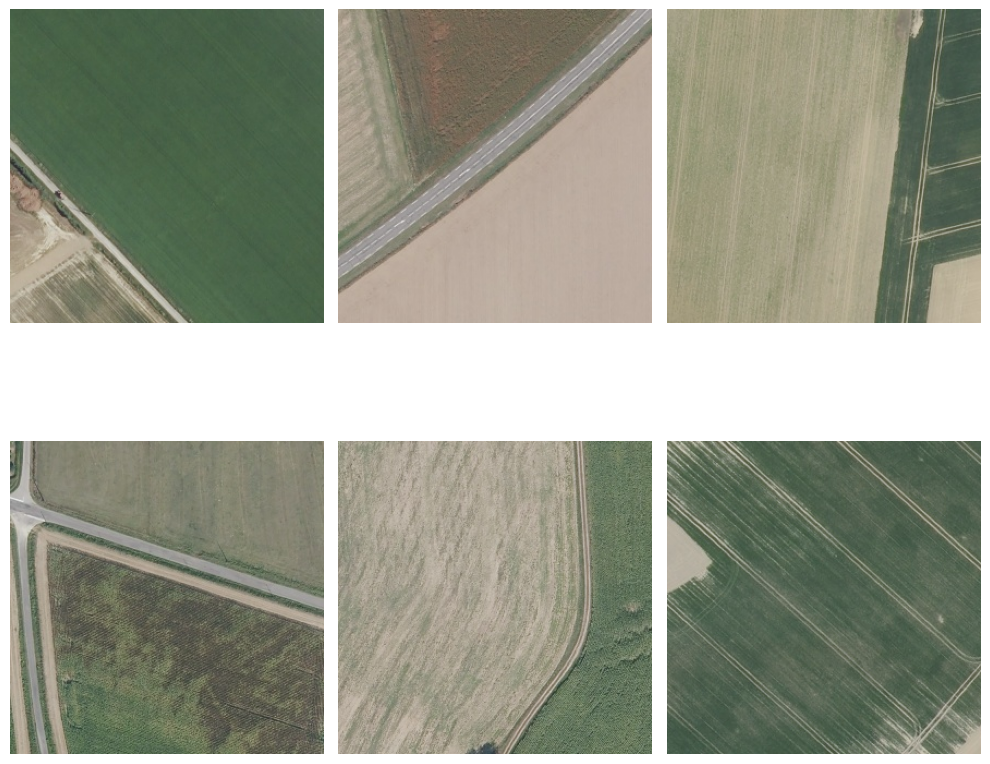

In [33]:
img_1 = cv2.imread(f'vignettes/rgb/{file_paths[0][4:6]}/rgb_{int(10*(np.floor(int(file_paths[0][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[0][14:18])/10 * 2) / 2))}/{file_paths[0]}')
img_2 = cv2.imread(f'vignettes/rgb/{file_paths[1][4:6]}/rgb_{int(10*(np.floor(int(file_paths[1][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[1][14:18])/10 * 2) / 2))}/{file_paths[1]}')
img_3 = cv2.imread(f'vignettes/rgb/{file_paths[2][4:6]}/rgb_{int(10*(np.floor(int(file_paths[2][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[2][14:18])/10 * 2) / 2))}/{file_paths[2]}')
img_4 = cv2.imread(f'vignettes/rgb/{file_paths[3][4:6]}/rgb_{int(10*(np.floor(int(file_paths[3][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[3][14:18])/10 * 2) / 2))}/{file_paths[3]}')
img_5 = cv2.imread(f'vignettes/rgb/{file_paths[4][4:6]}/rgb_{int(10*(np.floor(int(file_paths[4][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[4][14:18])/10 * 2) / 2))}/{file_paths[4]}')
img_6 = cv2.imread(f'vignettes/rgb/{file_paths[5][4:6]}/rgb_{int(10*(np.floor(int(file_paths[5][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[5][14:18])/10 * 2) / 2))}/{file_paths[5]}')

fig, axes = plt.subplots(nrows=2, ncols=3,
                         sharex=True, sharey=True, figsize=(10, 10))

ax = axes.ravel()

ax[0].imshow(img_1)
ax[1].imshow(img_2)
ax[2].imshow(img_3)
ax[3].imshow(img_4)
ax[4].imshow(img_5)
ax[5].imshow(img_6)

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

# Cluster 9

In [34]:
file_paths = clustered_df[(clustered_df['cluster'] == 9)].file.sample(6).values

ValueError: a must be greater than 0 unless no samples are taken

In [ ]:
img_1 = cv2.imread(f'vignettes/rgb/{file_paths[0][4:6]}/rgb_{int(10*(np.floor(int(file_paths[0][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[0][14:18])/10 * 2) / 2))}/{file_paths[0]}')
img_2 = cv2.imread(f'vignettes/rgb/{file_paths[1][4:6]}/rgb_{int(10*(np.floor(int(file_paths[1][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[1][14:18])/10 * 2) / 2))}/{file_paths[1]}')
img_3 = cv2.imread(f'vignettes/rgb/{file_paths[2][4:6]}/rgb_{int(10*(np.floor(int(file_paths[2][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[2][14:18])/10 * 2) / 2))}/{file_paths[2]}')
img_4 = cv2.imread(f'vignettes/rgb/{file_paths[3][4:6]}/rgb_{int(10*(np.floor(int(file_paths[3][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[3][14:18])/10 * 2) / 2))}/{file_paths[3]}')
img_5 = cv2.imread(f'vignettes/rgb/{file_paths[4][4:6]}/rgb_{int(10*(np.floor(int(file_paths[4][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[4][14:18])/10 * 2) / 2))}/{file_paths[4]}')
img_6 = cv2.imread(f'vignettes/rgb/{file_paths[5][4:6]}/rgb_{int(10*(np.floor(int(file_paths[5][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[5][14:18])/10 * 2) / 2))}/{file_paths[5]}')

fig, axes = plt.subplots(nrows=2, ncols=3,
                         sharex=True, sharey=True, figsize=(10, 10))

ax = axes.ravel()

ax[0].imshow(img_1)
ax[1].imshow(img_2)
ax[2].imshow(img_3)
ax[3].imshow(img_4)
ax[4].imshow(img_5)
ax[5].imshow(img_6)

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

# Clusterisation cluster 0

In [63]:
X_cluster_0 = X_cluster_0_only.drop(["dept", 'file'], axis=1)
X_cluster_0 = normalize(X_cluster_0.replace(np.nan, 0))
n_clusters = 5
kmeans_cluster_0 = KMeans(n_clusters=n_clusters, random_state=0, n_init="auto")
kmeans_cluster_0.fit(X_cluster_0)
kmeans_cluster_0.labels_

array([0, 0, 0, ..., 0, 4, 1])

In [64]:
X_cluster_0_copy = X_cluster_0.copy()
pca = PCA(n_components=2)
X_cluster_0_copy = pca.fit_transform(X_cluster_0_copy)
print(pca.explained_variance_ratio_)
print(pca.singular_values_)

[0.97644043 0.01430345]
[2.72724663 0.3300821 ]


In [65]:
X_cluster_0_copy.shape

(39375, 2)

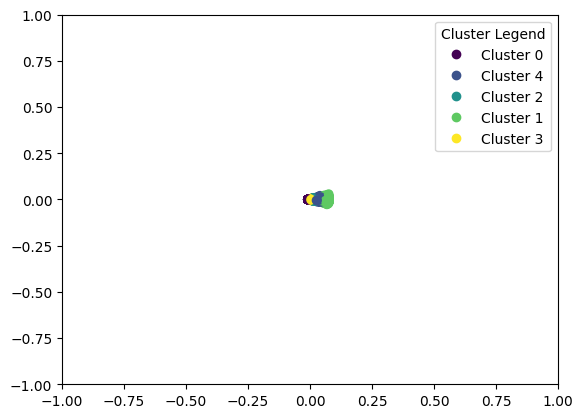

In [66]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import KMeans

# Assuming you already have your DataFrame and kmeans.labels_ defined
# X_copy = your DataFrame

# Create a scatter plot with color-coded points based on cluster labels
plt.xlim([-1, 1])
plt.ylim([-1, 1])

scatter = plt.scatter(X_cluster_0_copy.T[0], X_cluster_0_copy.T[1], c=kmeans_cluster_0.labels_)

# Get unique cluster labels
unique_labels = pd.unique(kmeans_cluster_0.labels_)

# Create a legend by associating each unique label with a color
legend_labels = [f'Cluster {label}' for label in unique_labels]

# Create a legend using the legend_labels and the scatter points
plt.legend(handles=scatter.legend_elements()[0], labels=legend_labels, title="Cluster Legend")

plt.show()


In [67]:
clustered_cluster_0 = pd.DataFrame(X_cluster_0_copy)
clustered_cluster_0['cluster'] = kmeans_cluster_0.labels_
clustered_cluster_0['file'] = X_cluster_0_only['file']
clustered_cluster_0['dept'] = X_cluster_0_only['dept']

## Cluster 0.0

In [85]:
file_paths = clustered_cluster_0[(clustered_cluster_0['cluster'] == 0)].file.sample(6).values
file_paths = [i for i in file_paths if type(i) == str]

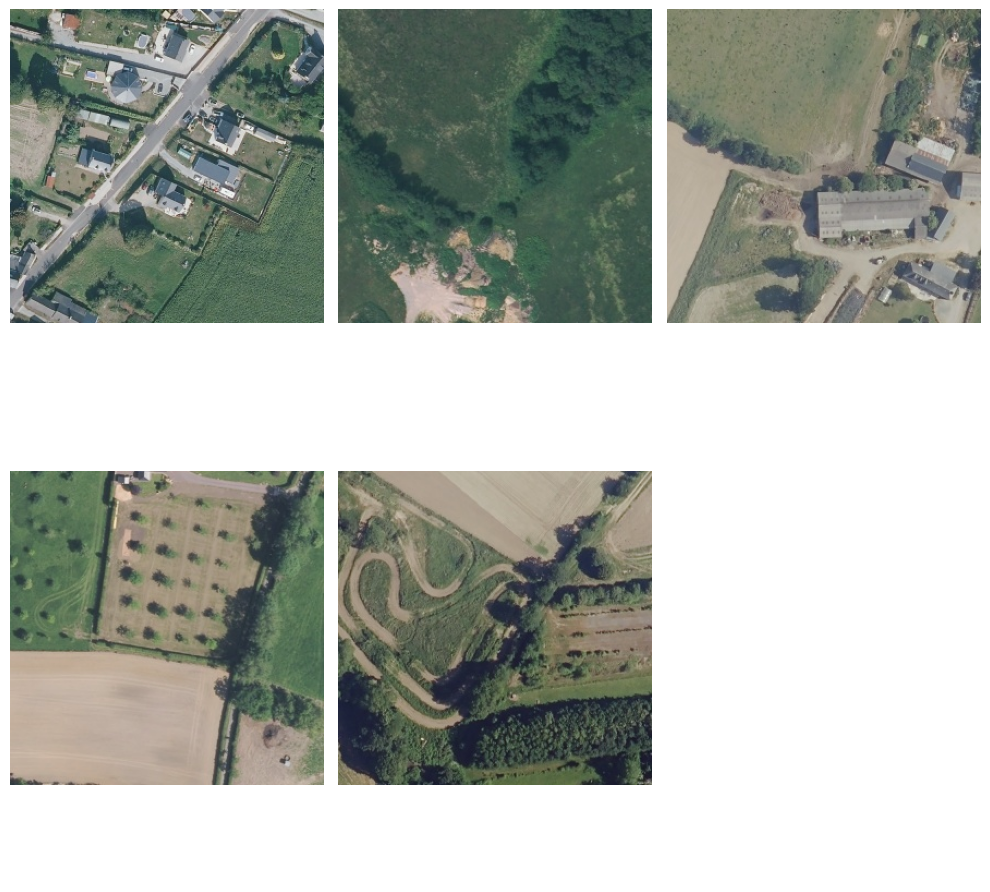

In [89]:
img_1 = cv2.imread(f'vignettes/rgb/{file_paths[0][4:6]}/rgb_{int(10*(np.floor(int(file_paths[0][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[0][14:18])/10 * 2) / 2))}/{file_paths[0]}')
img_2 = cv2.imread(f'vignettes/rgb/{file_paths[1][4:6]}/rgb_{int(10*(np.floor(int(file_paths[1][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[1][14:18])/10 * 2) / 2))}/{file_paths[1]}')
img_3 = cv2.imread(f'vignettes/rgb/{file_paths[2][4:6]}/rgb_{int(10*(np.floor(int(file_paths[2][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[2][14:18])/10 * 2) / 2))}/{file_paths[2]}')
img_4 = cv2.imread(f'vignettes/rgb/{file_paths[3][4:6]}/rgb_{int(10*(np.floor(int(file_paths[3][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[3][14:18])/10 * 2) / 2))}/{file_paths[3]}')
img_5 = cv2.imread(f'vignettes/rgb/{file_paths[4][4:6]}/rgb_{int(10*(np.floor(int(file_paths[4][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[4][14:18])/10 * 2) / 2))}/{file_paths[4]}')
# img_6 = cv2.imread(f'vignettes/rgb/{file_paths[5][4:6]}/rgb_{int(10*(np.floor(int(file_paths[5][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[5][14:18])/10 * 2) / 2))}/{file_paths[5]}')

fig, axes = plt.subplots(nrows=2, ncols=3,
                         sharex=True, sharey=True, figsize=(10, 10))

ax = axes.ravel()

ax[0].imshow(img_1)
ax[1].imshow(img_2)
ax[2].imshow(img_3)
ax[3].imshow(img_4)
ax[4].imshow(img_5)
# ax[5].imshow(img_6)

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

## cluster 0.1

In [90]:
file_paths = clustered_cluster_0[(clustered_cluster_0['cluster'] == 1)].file.sample(6).values
file_paths = [i for i in file_paths if type(i) == str]

In [95]:
len(file_paths)

4

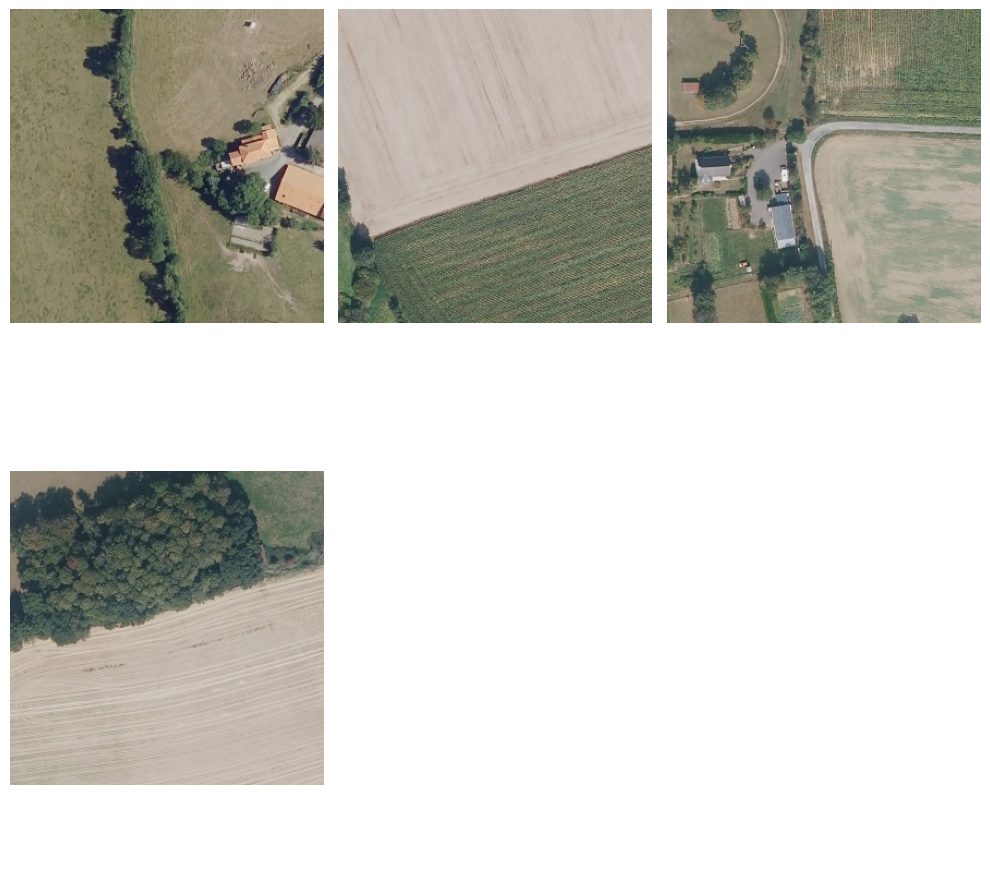

In [94]:
img_1 = cv2.imread(f'vignettes/rgb/{file_paths[0][4:6]}/rgb_{int(10*(np.floor(int(file_paths[0][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[0][14:18])/10 * 2) / 2))}/{file_paths[0]}')
img_2 = cv2.imread(f'vignettes/rgb/{file_paths[1][4:6]}/rgb_{int(10*(np.floor(int(file_paths[1][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[1][14:18])/10 * 2) / 2))}/{file_paths[1]}')
img_3 = cv2.imread(f'vignettes/rgb/{file_paths[2][4:6]}/rgb_{int(10*(np.floor(int(file_paths[2][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[2][14:18])/10 * 2) / 2))}/{file_paths[2]}')
img_4 = cv2.imread(f'vignettes/rgb/{file_paths[3][4:6]}/rgb_{int(10*(np.floor(int(file_paths[3][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[3][14:18])/10 * 2) / 2))}/{file_paths[3]}')
# img_5 = cv2.imread(f'vignettes/rgb/{file_paths[4][4:6]}/rgb_{int(10*(np.floor(int(file_paths[4][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[4][14:18])/10 * 2) / 2))}/{file_paths[4]}')
# img_6 = cv2.imread(f'vignettes/rgb/{file_paths[5][4:6]}/rgb_{int(10*(np.floor(int(file_paths[5][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[5][14:18])/10 * 2) / 2))}/{file_paths[5]}')

fig, axes = plt.subplots(nrows=2, ncols=3,
                         sharex=True, sharey=True, figsize=(10, 10))

ax = axes.ravel()

ax[0].imshow(img_1)
ax[1].imshow(img_2)
ax[2].imshow(img_3)
ax[3].imshow(img_4)
# ax[4].imshow(img_5)
# ax[5].imshow(img_6)

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

## cluster 0.2

In [96]:
file_paths = clustered_cluster_0[(clustered_cluster_0['cluster'] == 2)].file.sample(6).values
file_paths = [i for i in file_paths if type(i) == str]

In [97]:
len(file_paths)

6

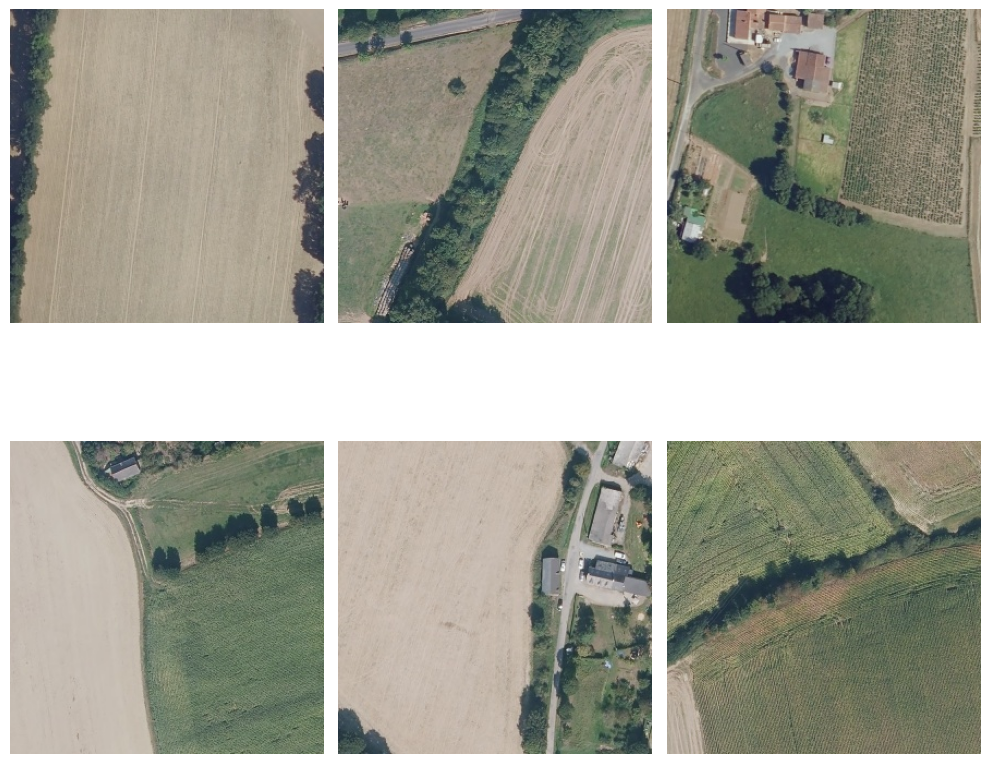

In [98]:
img_1 = cv2.imread(f'vignettes/rgb/{file_paths[0][4:6]}/rgb_{int(10*(np.floor(int(file_paths[0][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[0][14:18])/10 * 2) / 2))}/{file_paths[0]}')
img_2 = cv2.imread(f'vignettes/rgb/{file_paths[1][4:6]}/rgb_{int(10*(np.floor(int(file_paths[1][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[1][14:18])/10 * 2) / 2))}/{file_paths[1]}')
img_3 = cv2.imread(f'vignettes/rgb/{file_paths[2][4:6]}/rgb_{int(10*(np.floor(int(file_paths[2][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[2][14:18])/10 * 2) / 2))}/{file_paths[2]}')
img_4 = cv2.imread(f'vignettes/rgb/{file_paths[3][4:6]}/rgb_{int(10*(np.floor(int(file_paths[3][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[3][14:18])/10 * 2) / 2))}/{file_paths[3]}')
img_5 = cv2.imread(f'vignettes/rgb/{file_paths[4][4:6]}/rgb_{int(10*(np.floor(int(file_paths[4][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[4][14:18])/10 * 2) / 2))}/{file_paths[4]}')
img_6 = cv2.imread(f'vignettes/rgb/{file_paths[5][4:6]}/rgb_{int(10*(np.floor(int(file_paths[5][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[5][14:18])/10 * 2) / 2))}/{file_paths[5]}')

fig, axes = plt.subplots(nrows=2, ncols=3,
                         sharex=True, sharey=True, figsize=(10, 10))

ax = axes.ravel()

ax[0].imshow(img_1)
ax[1].imshow(img_2)
ax[2].imshow(img_3)
ax[3].imshow(img_4)
ax[4].imshow(img_5)
ax[5].imshow(img_6)

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

## cluster 0.3

In [99]:
file_paths = clustered_cluster_0[(clustered_cluster_0['cluster'] == 3)].file.sample(6).values
file_paths = [i for i in file_paths if type(i) == str]

In [100]:
len(file_paths)

5

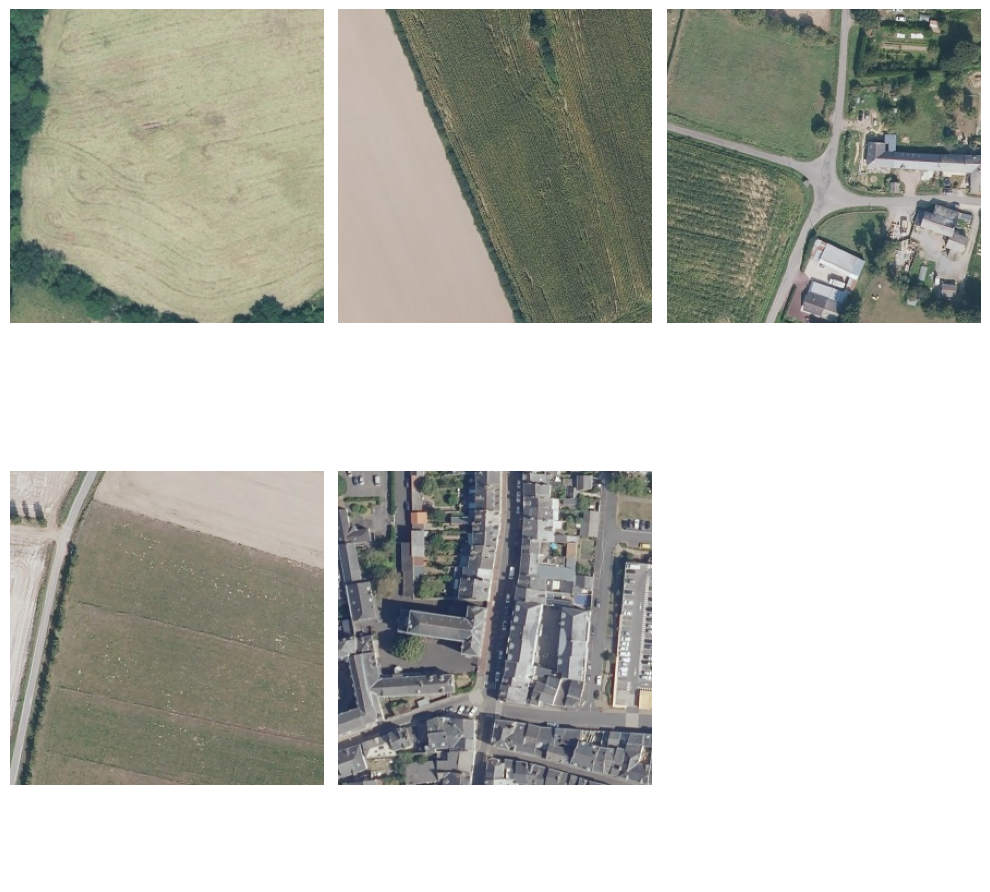

In [101]:
img_1 = cv2.imread(f'vignettes/rgb/{file_paths[0][4:6]}/rgb_{int(10*(np.floor(int(file_paths[0][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[0][14:18])/10 * 2) / 2))}/{file_paths[0]}')
img_2 = cv2.imread(f'vignettes/rgb/{file_paths[1][4:6]}/rgb_{int(10*(np.floor(int(file_paths[1][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[1][14:18])/10 * 2) / 2))}/{file_paths[1]}')
img_3 = cv2.imread(f'vignettes/rgb/{file_paths[2][4:6]}/rgb_{int(10*(np.floor(int(file_paths[2][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[2][14:18])/10 * 2) / 2))}/{file_paths[2]}')
img_4 = cv2.imread(f'vignettes/rgb/{file_paths[3][4:6]}/rgb_{int(10*(np.floor(int(file_paths[3][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[3][14:18])/10 * 2) / 2))}/{file_paths[3]}')
img_5 = cv2.imread(f'vignettes/rgb/{file_paths[4][4:6]}/rgb_{int(10*(np.floor(int(file_paths[4][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[4][14:18])/10 * 2) / 2))}/{file_paths[4]}')
# img_6 = cv2.imread(f'vignettes/rgb/{file_paths[5][4:6]}/rgb_{int(10*(np.floor(int(file_paths[5][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[5][14:18])/10 * 2) / 2))}/{file_paths[5]}')

fig, axes = plt.subplots(nrows=2, ncols=3,
                         sharex=True, sharey=True, figsize=(10, 10))

ax = axes.ravel()

ax[0].imshow(img_1)
ax[1].imshow(img_2)
ax[2].imshow(img_3)
ax[3].imshow(img_4)
ax[4].imshow(img_5)
# ax[5].imshow(img_6)

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

## cluster 0.4

In [102]:
file_paths = clustered_cluster_0[(clustered_cluster_0['cluster'] == 4)].file.sample(6).values
file_paths = [i for i in file_paths if type(i) == str]

In [103]:
len(file_paths)

5

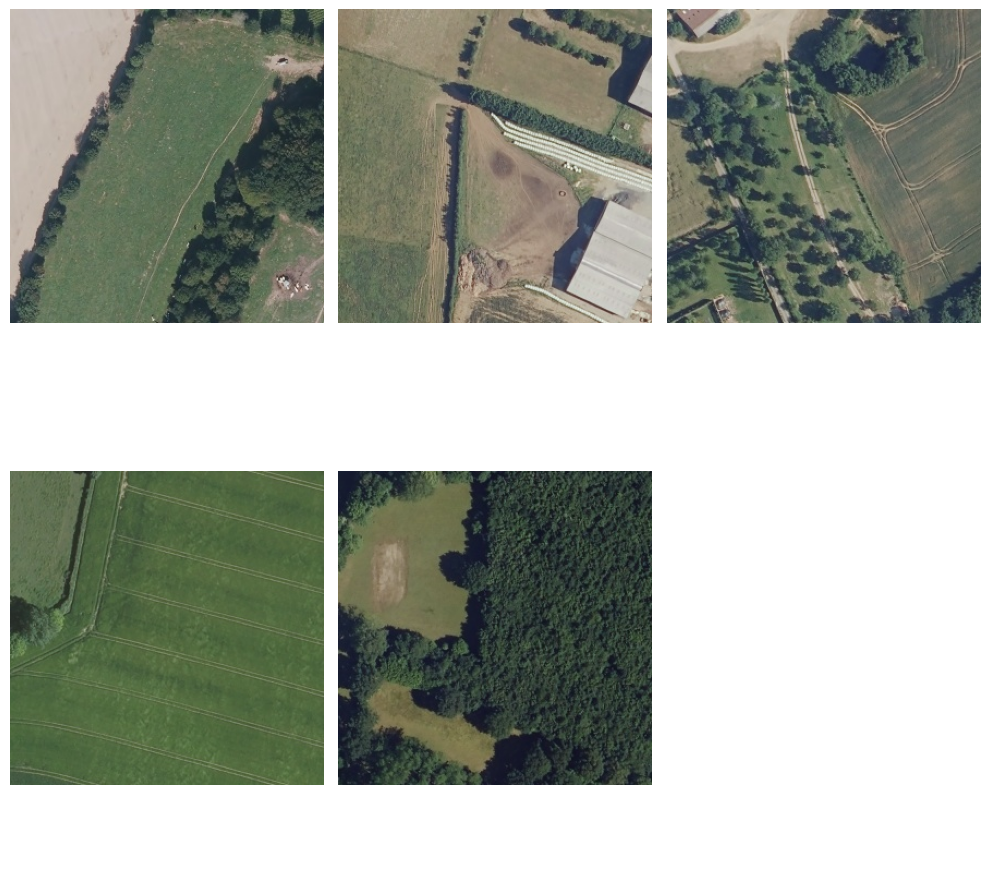

In [104]:
img_1 = cv2.imread(f'vignettes/rgb/{file_paths[0][4:6]}/rgb_{int(10*(np.floor(int(file_paths[0][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[0][14:18])/10 * 2) / 2))}/{file_paths[0]}')
img_2 = cv2.imread(f'vignettes/rgb/{file_paths[1][4:6]}/rgb_{int(10*(np.floor(int(file_paths[1][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[1][14:18])/10 * 2) / 2))}/{file_paths[1]}')
img_3 = cv2.imread(f'vignettes/rgb/{file_paths[2][4:6]}/rgb_{int(10*(np.floor(int(file_paths[2][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[2][14:18])/10 * 2) / 2))}/{file_paths[2]}')
img_4 = cv2.imread(f'vignettes/rgb/{file_paths[3][4:6]}/rgb_{int(10*(np.floor(int(file_paths[3][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[3][14:18])/10 * 2) / 2))}/{file_paths[3]}')
img_5 = cv2.imread(f'vignettes/rgb/{file_paths[4][4:6]}/rgb_{int(10*(np.floor(int(file_paths[4][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[4][14:18])/10 * 2) / 2))}/{file_paths[4]}')
# img_6 = cv2.imread(f'vignettes/rgb/{file_paths[5][4:6]}/rgb_{int(10*(np.floor(int(file_paths[5][7:10])/10 * 2) / 2))}_{int(10*(np.ceil(int(file_paths[5][14:18])/10 * 2) / 2))}/{file_paths[5]}')

fig, axes = plt.subplots(nrows=2, ncols=3,
                         sharex=True, sharey=True, figsize=(10, 10))

ax = axes.ravel()

ax[0].imshow(img_1)
ax[1].imshow(img_2)
ax[2].imshow(img_3)
ax[3].imshow(img_4)
ax[4].imshow(img_5)
# ax[5].imshow(img_6)

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()

# Autre

In [ ]:
rgb_img_paths = [i for i in sorted(
    list(
        itertools.chain.from_iterable(
            [glob(i + "*.jpg") for i in glob("vignettes/rgb/*/*/", recursive=True)]
        )
    )
) if i[34:-4] in clustered_df[clustered_df['cluster'] == 1].file.tolist()]